# Exploratory Data Analysis

An initial exploratory data analysis and some preprocessing is necessary to gain insights into the data. In this project, we use the Tomato Leaves Dataset from Kaggle to predict tomato leaf diseases. Given the variety of diseases, we will first identify how many there are and the **amount of image data available for each**.

Next, we will examine the **characteristics of the images, such as their sizes and any discrepancies** between them.

Our second goal is to balance the classes. We will apply **data augmentation for underrepresented classes** and **remove images from overrepresented classes**.

Finally, to **train models at a reasonable speed**, we may need to **reduce the size of the images**. However, we must choose the reduced size carefully; overly small images may lose critical information for accurate predictions. Hence, we must find a balance between reducing image size to decrease model training times and retaining necessary information, especially for diseases that are small relative to the overall image size.


In [21]:
import os
import cv2
import shutil
import random
import numpy as np
import pandas as pd
import seaborn as sns
from PIL import Image
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [22]:
# Moving to all_images directory
%cd all_images

[Errno 2] No such file or directory: 'all_images'
/Users/antoinethomas/Documents/Python Projects/ML Group Project/all_images


In [23]:
# Print all files in the directory
%ls

1375.11s - pydevd: Sending message related to process being replaced timed-out after 5 seconds
train/ valid/


In [24]:
# Combining all images into a single folder

def combine_folders(train_folder, validate_folder, meta_folder):
    # Create the meta folder if it doesn't exist
    if not os.path.exists(meta_folder):
        os.makedirs(meta_folder)

    # Iterate through train and validate folders
    for folder in [train_folder, validate_folder]:
        for class_folder in os.listdir(folder):
            class_path = os.path.join(folder, class_folder)
            if os.path.isdir(class_path):
                meta_class_path = os.path.join(meta_folder, class_folder)
                # Create the class folder in the meta folder if it doesn't exist
                if not os.path.exists(meta_class_path):
                    os.makedirs(meta_class_path)
                # Copy images from the class folder to the corresponding folder in the meta folder
                for file_name in os.listdir(class_path):
                    file_path = os.path.join(class_path, file_name)
                    if os.path.isfile(file_path):
                        shutil.copy(file_path, meta_class_path)

train_folder = "train"
validate_folder = "valid"
meta_folder = "all_images"

combine_folders(train_folder, validate_folder, meta_folder)


In [25]:
# Bacterial Spot class: 
# 0a6d40e4-75d6-4659-8bc1-22f47cdb2ca8___GCREC_Bact.Sp 6247.JPG

# for every file in folder, only keep everything after ___
def remove_prefix(folder_path):
    for root, dirs, files in os.walk(folder_path):
        for file in files:
            if "___" in file:
                new_file = file.split("___")[1]
                os.rename(os.path.join(root, file), os.path.join(root, new_file))

folder_path = "all_images"
remove_prefix(folder_path)


## Distribution of Labels

In [26]:
# Get amount of images in each subfolder
def get_substructure_with_counts(folder_path):
    substructure_counts = []
    for root, dirs, files in os.walk(folder_path):
        # Get the relative path from the folder_path to the current root
        relative_path = os.path.relpath(root, folder_path)
        # Count the number of items (files and directories) in the current substructure
        item_count = len(dirs) + len(files)
        # Append the relative path and item count as a tuple
        substructure_counts.append((relative_path, item_count))
    return substructure_counts

folder_path = "all_images"
substructure_counts = get_substructure_with_counts(folder_path)

# Sort the substructure counts based on the "Count" column in ascending order
substructure_counts_sorted = sorted(substructure_counts, key=lambda x: x[1])
print("Sub-structure with counts (sorted by Substructure in ascending order):")
substructure_counts_sorted = pd.DataFrame(substructure_counts_sorted, columns=["Substructure", "Count"])
substructure_counts_sorted

Sub-structure with counts (sorted by Substructure in ascending order):


,Substructure,Count
0,.,11
1,powdery_mildew,1256
2,Spider_mites Two-spotted_spider_mite,2182
3,Target_Spot,2284
4,Tomato_Yellow_Leaf_Curl_Virus,2537
5,Tomato_mosaic_virus,2737
6,Early_blight,3098
7,Leaf_Mold,3493
8,Bacterial_spot,3558
9,Septoria_leaf_spot,3628


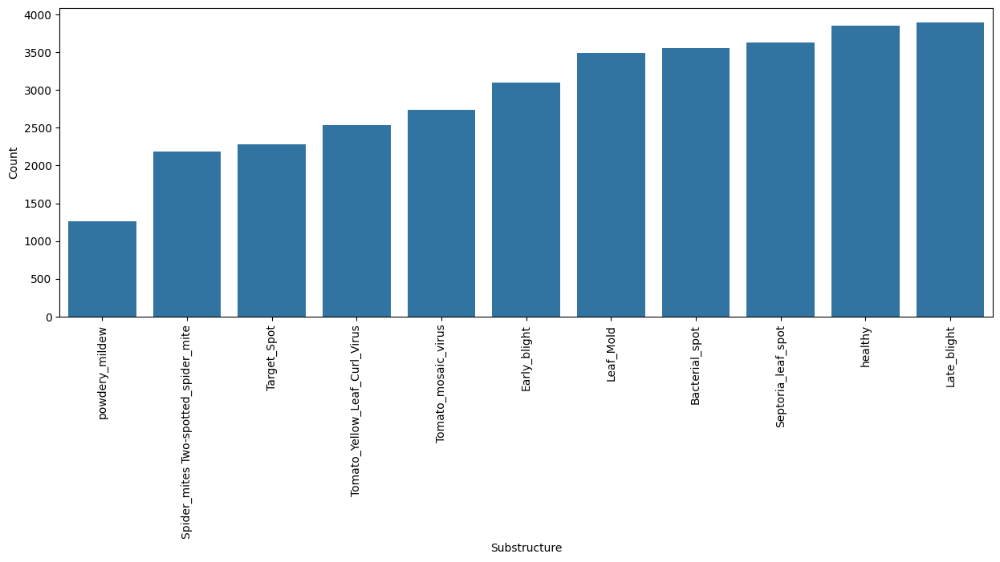

In [27]:
# Remove the root folder from the substructure counts
substructure_counts_sorted = substructure_counts_sorted[substructure_counts_sorted["Substructure"] != "."]

# Plot a bar chart of the substructure counts
plt.figure(figsize=(15, 5))
sns.barplot(x="Substructure", y="Count", data=substructure_counts_sorted)
plt.xticks(rotation=90)
plt.show()



We have information on 11 diseases in total, but the amount of information varies. For instance, there are only 1256 images for "Powdery Mildew", while "Late Blight" has 3895 images. All other diseases fall somewhere between these two.

Given this disparity, we will attempt to balance the representation. We will trim down overrepresented diseases and use data augmentation to increase the number of images for underrepresented diseases.

For this exploratory data analysis (EDA), we opted to use 2000 images per disease for model training. As such, we'll need to randomly remove excess images from all diseases except "Powdery Mildew" and employ data augmentation to generate the required images for this category.

### Remove Excess Images

In [28]:
# Function that removes a given amount of randomly chosen images from a given folder
def shuffle_and_delete_excess_images(image_folder, max_images_per_class):
    for class_folder in os.listdir(image_folder):
        class_path = os.path.join(image_folder, class_folder)
        if os.path.isdir(class_path):
            num_images = len(os.listdir(class_path))
            if num_images > max_images_per_class:
                # Shuffle the list of file names in the class folder
                files = os.listdir(class_path)
                random.shuffle(files)
                # Delete excess images beyond max_images_per_class
                for file_name in files[max_images_per_class:]:
                    file_path = os.path.join(class_path, file_name)
                    os.remove(file_path)

In [29]:
# Choose the maximum number of images per class
max_images_per_class = 2000

shuffle_and_delete_excess_images("all_images", max_images_per_class)

In [30]:
folder_path = "all_images"
substructure_counts = get_substructure_with_counts(folder_path)

# Sort the substructure counts based on the "Count" column in ascending order
substructure_counts_sorted = sorted(substructure_counts, key=lambda x: x[1])

# Print the sorted result as a table
print("Sub-structure with counts (sorted by Substructure in ascending order):")
substructure_counts_sorted = pd.DataFrame(substructure_counts_sorted, columns=["Substructure", "Count"])
substructure_counts_sorted

Sub-structure with counts (sorted by Substructure in ascending order):


,Substructure,Count
0,.,11
1,powdery_mildew,1256
2,Late_blight,2000
3,Septoria_leaf_spot,2000
4,Tomato_Yellow_Leaf_Curl_Virus,2000
5,healthy,2000
6,Early_blight,2000
7,Target_Spot,2000
8,Leaf_Mold,2000
9,Tomato_mosaic_virus,2000


## Data Augemtation for "Powdery Mildew"

In [32]:
# Augment images for powdery mildew class
# class is already heavily augmented with rotations and flips


# Define the augmentation parameters
datagen = ImageDataGenerator(
    width_shift_range=0.3,
    height_shift_range=0.3,
    zoom_range=0.3,
    fill_mode='nearest'
)

# Path to the folder containing your images
folder_path = "all_images/powdery_mildew"

# Get the list of image files in the folder
image_files = [f for f in os.listdir(folder_path) if f.endswith(('.png', '.jpg', '.jpeg'))]

# Number of images you want to augment
num_augmented_images = 744

image_files = random.sample(image_files, num_augmented_images)

# Augment the images
for image_file in image_files:
    # Read the image
    image_path = os.path.join(folder_path, image_file)
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB
    
    # Reshape the image to (1, height, width, channels) for the datagen.flow() function
    image = np.expand_dims(image, axis=0)
    
    # Generate augmented images
    augmented_image = datagen.flow(image, batch_size=1)
    
    # Save the augmented images
    augmented_image = next(augmented_image)[0].astype(np.uint8)
    augmented_image_path = os.path.join(folder_path, f"{os.path.splitext(image_file)[0]}_aug.jpg")
    cv2.imwrite(augmented_image_path, cv2.cvtColor(augmented_image, cv2.COLOR_RGB2BGR))  # Convert back to BGR for saving
        
        

In [33]:
folder_path = "all_images"
substructure_counts = get_substructure_with_counts(folder_path)

# Sort the substructure counts based on the "Count" column in ascending order
substructure_counts_sorted = sorted(substructure_counts, key=lambda x: x[1])

# Print the sorted result as a table
print("Sub-structure with counts (sorted by Substructure in ascending order):")
substructure_counts_sorted = pd.DataFrame(substructure_counts_sorted, columns=["Substructure", "Count"])
substructure_counts_sorted

Sub-structure with counts (sorted by Substructure in ascending order):


,Substructure,Count
0,.,11
1,Late_blight,2000
2,Septoria_leaf_spot,2000
3,Tomato_Yellow_Leaf_Curl_Virus,2000
4,powdery_mildew,2000
5,healthy,2000
6,Early_blight,2000
7,Target_Spot,2000
8,Leaf_Mold,2000
9,Tomato_mosaic_virus,2000


## Image Formatting

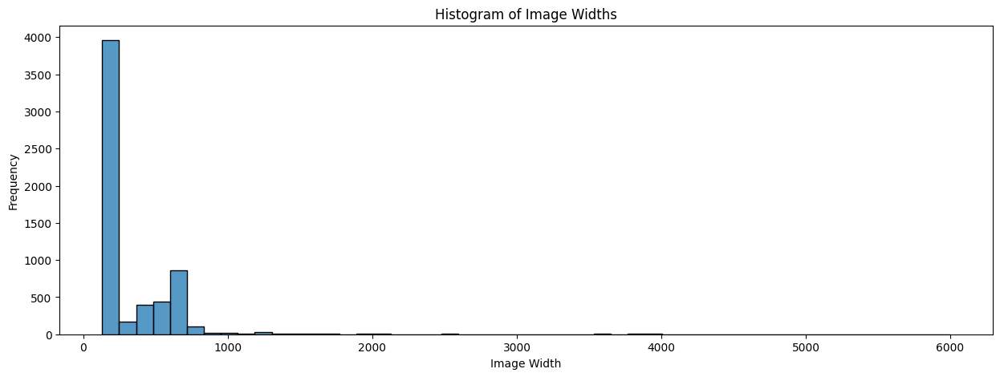

In [34]:
# Plot a bar chart of all the images width

def get_image_widths(folder_path):
    image_widths = []
    for root, dirs, files in os.walk(folder_path):
        for file in files:
            file_path = os.path.join(root, file)
            if file_path.endswith(('.png', '.jpg', '.jpeg')):
                image = Image.open(file_path)
                width, height = image.size
                image_widths.append(width)
    return image_widths

folder_path = "all_images"
image_widths = get_image_widths(folder_path)

# Plot a histogram of the image widths
plt.figure(figsize=(15, 5))
sns.histplot(image_widths, bins=50)
plt.xlabel("Image Width")
plt.ylabel("Frequency")
plt.title("Histogram of Image Widths")
plt.show()


From the analysis, it can be seen that most of the provided images range in size from 200px x 200px to 800px x 800px, with a few outliers up to 6000px x 6000px. To standardize the dataset and speed up the training process, we will consider rescaling these images.

Class: Late_blight


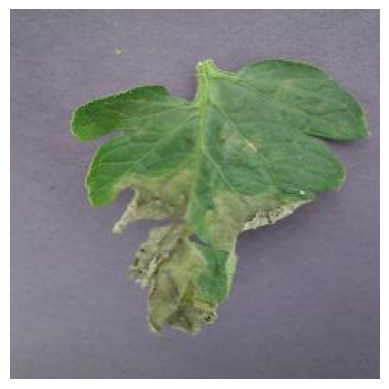

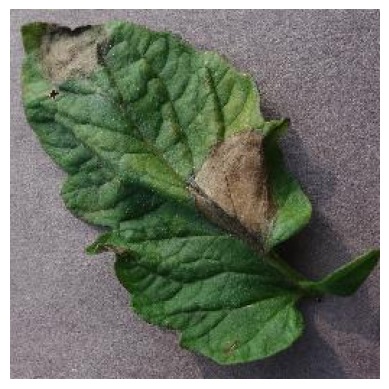

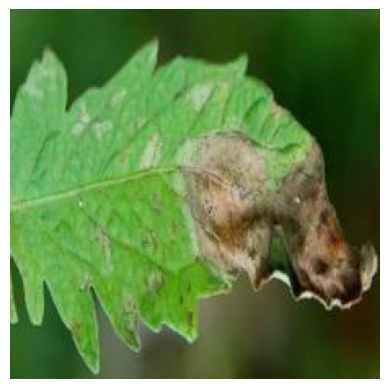

Class: Septoria_leaf_spot


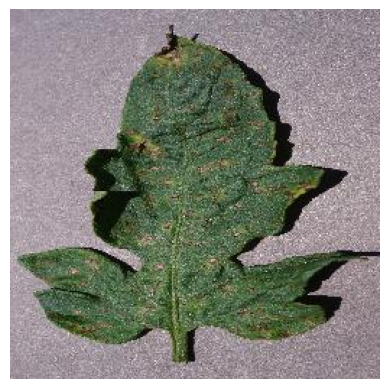

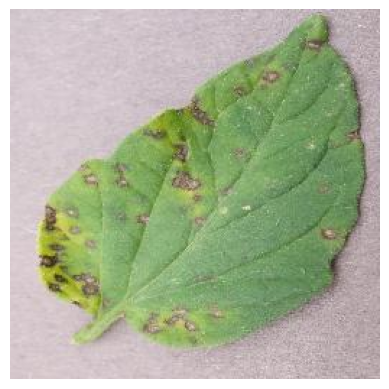

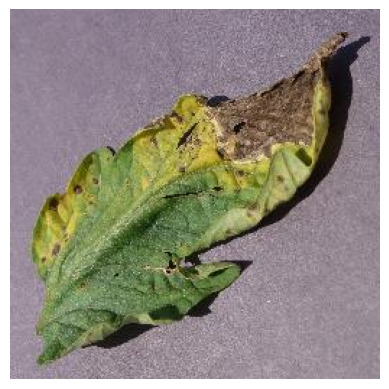

Class: Tomato_Yellow_Leaf_Curl_Virus


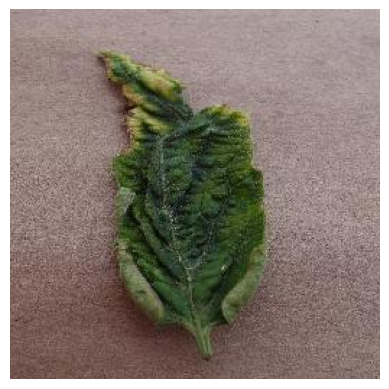

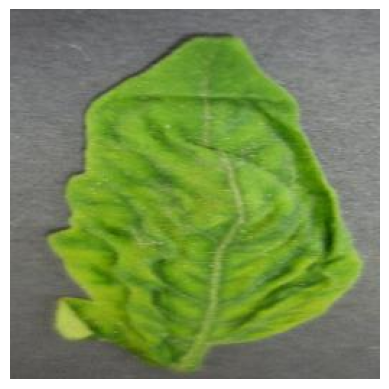

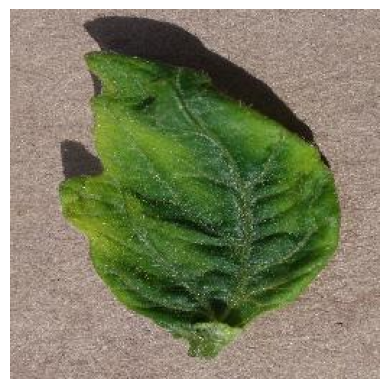

Class: powdery_mildew


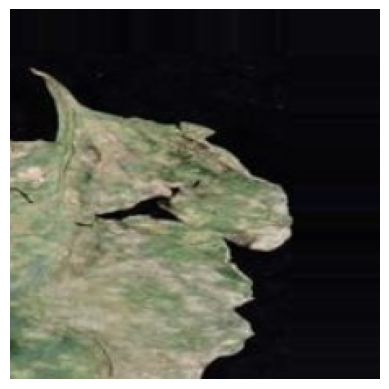

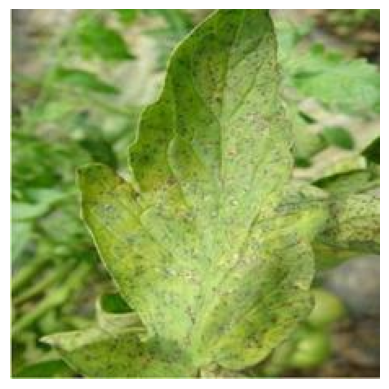

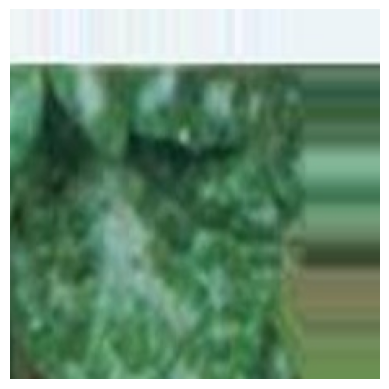

Class: healthy


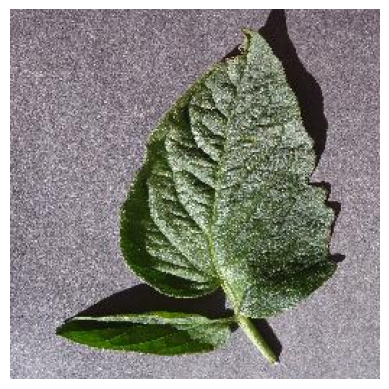

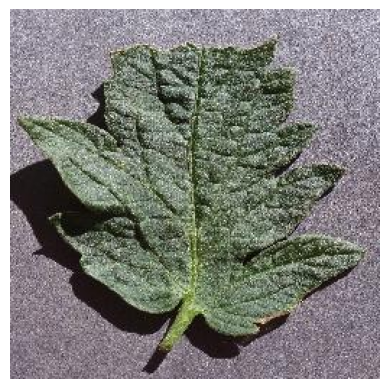

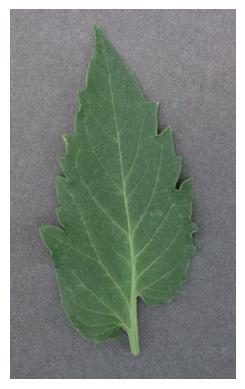

Class: Early_blight


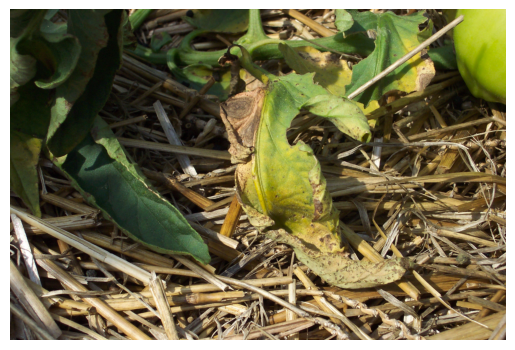

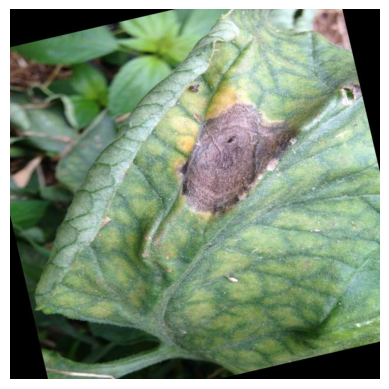

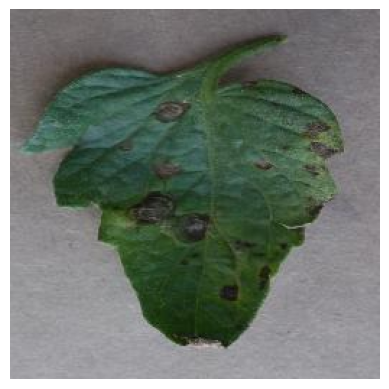

Class: Target_Spot


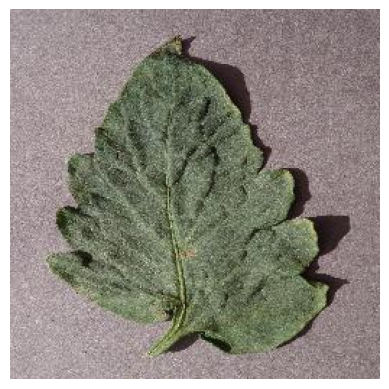

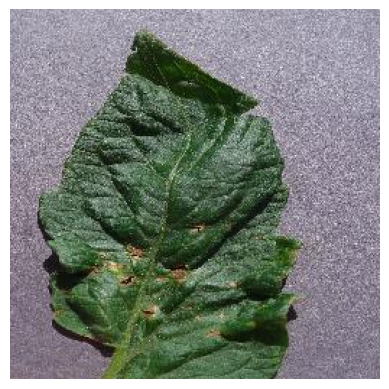

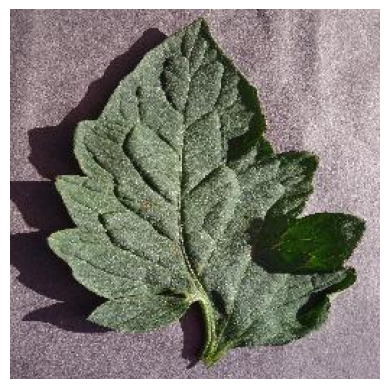

Class: Leaf_Mold


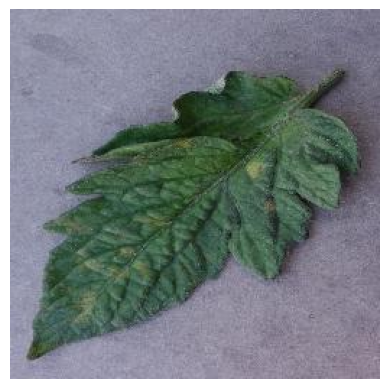

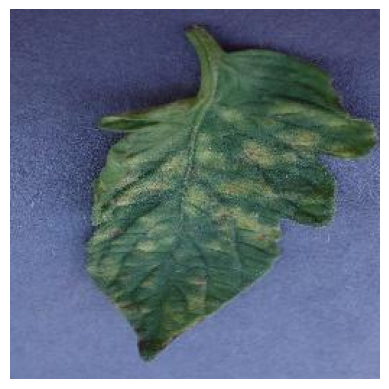

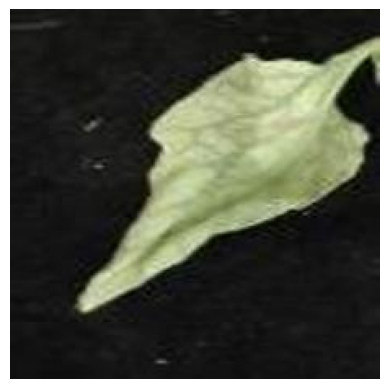

Class: Tomato_mosaic_virus


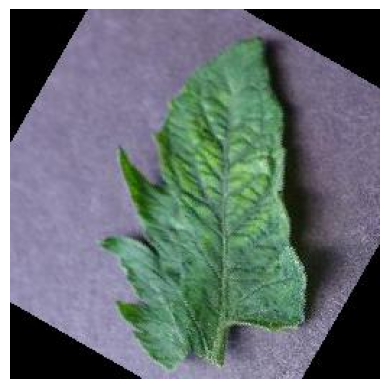

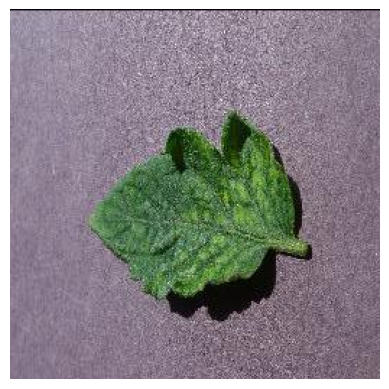

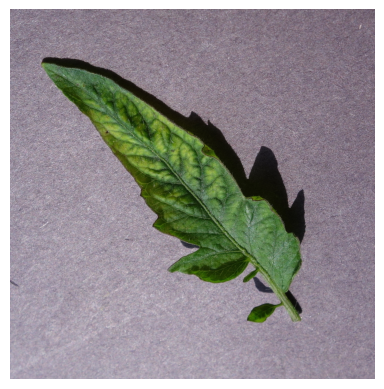

Class: Bacterial_spot


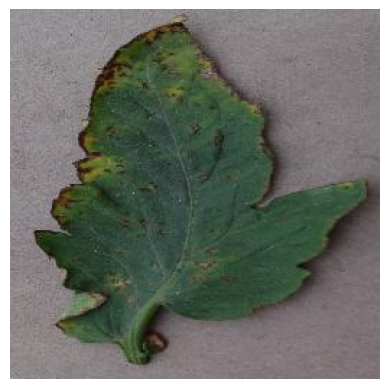

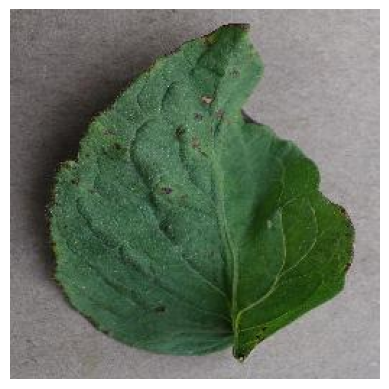

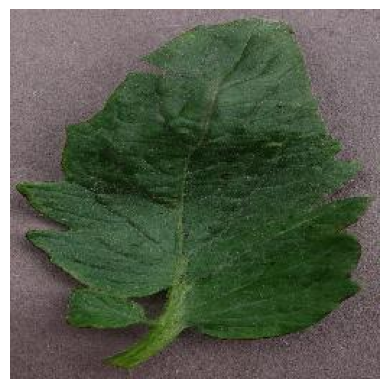

Class: Spider_mites Two-spotted_spider_mite


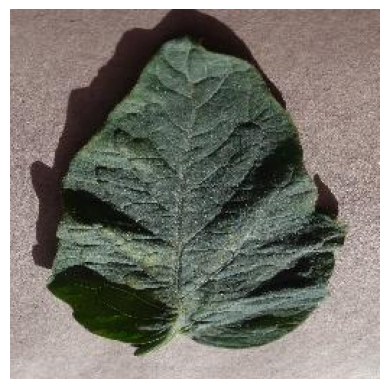

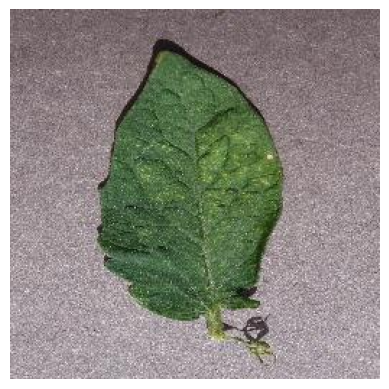

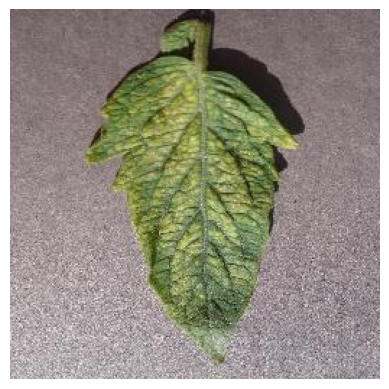

In [35]:
# Print three original images for each class
def print_images(folder_path, num_images_per_class):
    for class_folder in os.listdir(folder_path):
        class_path = os.path.join(folder_path, class_folder)
        if os.path.isdir(class_path):
            print(f"Class: {class_folder}")
            image_files = [f for f in os.listdir(class_path) if f.endswith(('.png', '.jpg', '.jpeg', '.JPG'))]
            image_files = random.sample(image_files, num_images_per_class)
            for i, image_file in enumerate(image_files):
                image_path = os.path.join(class_path, image_file)
                image = cv2.imread(image_path)
                image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
                plt.imshow(image)
                plt.axis("off")
                plt.show()
        
folder_path = "all_images"
num_images_per_class = 3
print_images(folder_path, num_images_per_class)

In the subsequent section, the original images are downscaled to a square format of XYZ x XYZ pixels. Through a trial and error process, it was determined that a **resolution of 128px x 128px strikes a good balance between size reduction and minimal information loss**.

In [37]:
# format all images to target size that is suitable for many classification pre-trained models 

def preprocess_image(image_path, target_size):
    # Load image using PIL
    img = Image.open(image_path)
    # Resize image
    img = img.resize(target_size)
    # Convert image to numpy array and normalize pixel values to range [0, 1]
    img_array = np.array(img) / 255.0
    # Convert image to RGB if it's grayscale
    if len(img_array.shape) == 2:
        img_array = np.stack((img_array,) * 3, axis=-1)
    return img_array

target_size = (128, 128)  # Target size for ResNet or VGG
folders = os.listdir("all_images")

# Preprocess all images
for folder in folders:
    for file in os.listdir(f"all_images/{folder}"):
        image_path = f"all_images/{folder}/{file}"
        preprocessed_image = preprocess_image(image_path, target_size)
        print("Preprocessed image shape:", preprocessed_image.shape)
        # Convert to float32 for OpenCV
        preprocessed_image = (preprocessed_image * 255).astype(np.uint8)
        # save preprocessed image to disk as a JPEG file in new subfolder
        new_folder = f"all_images_preprocessed/{folder}"
        if not os.path.exists(new_folder):
            os.makedirs(new_folder)
        new_image_path = f"{new_folder}/{file}"
        cv2.imwrite(new_image_path, cv2.cvtColor(preprocessed_image, cv2.COLOR_RGB2BGR))



Preprocessed image shape: (128, 128, 3)
Preprocessed image shape: (128, 128, 3)
Preprocessed image shape: (128, 128, 3)
Preprocessed image shape: (128, 128, 3)
Preprocessed image shape: (128, 128, 3)
Preprocessed image shape: (128, 128, 3)
Preprocessed image shape: (128, 128, 3)
Preprocessed image shape: (128, 128, 3)
Preprocessed image shape: (128, 128, 3)
Preprocessed image shape: (128, 128, 3)
Preprocessed image shape: (128, 128, 3)
Preprocessed image shape: (128, 128, 3)
Preprocessed image shape: (128, 128, 3)
Preprocessed image shape: (128, 128, 3)
Preprocessed image shape: (128, 128, 3)
Preprocessed image shape: (128, 128, 3)
Preprocessed image shape: (128, 128, 3)
Preprocessed image shape: (128, 128, 3)
Preprocessed image shape: (128, 128, 3)
Preprocessed image shape: (128, 128, 3)
Preprocessed image shape: (128, 128, 3)
Preprocessed image shape: (128, 128, 3)
Preprocessed image shape: (128, 128, 3)
Preprocessed image shape: (128, 128, 3)
Preprocessed image shape: (128, 128, 3)


Class: Late_blight


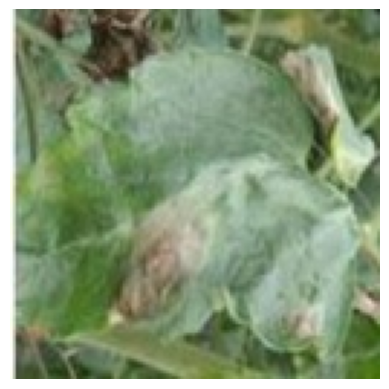

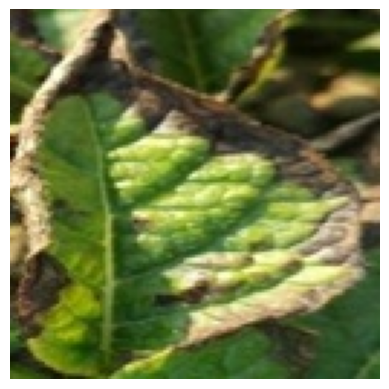

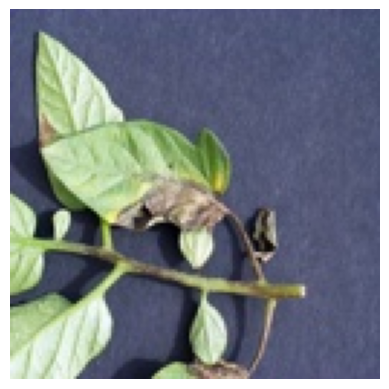

Class: Septoria_leaf_spot


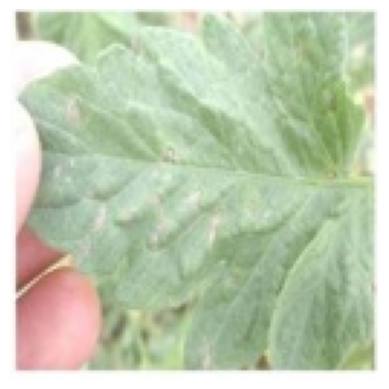

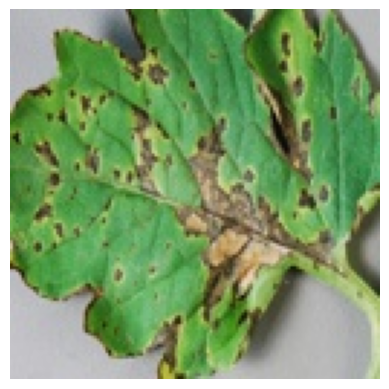

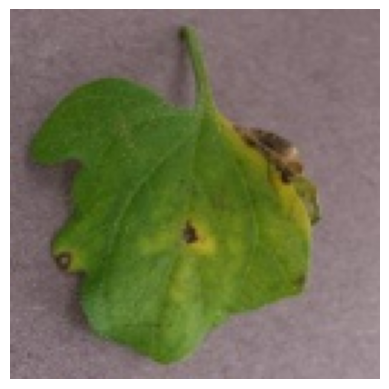

Class: Tomato_Yellow_Leaf_Curl_Virus


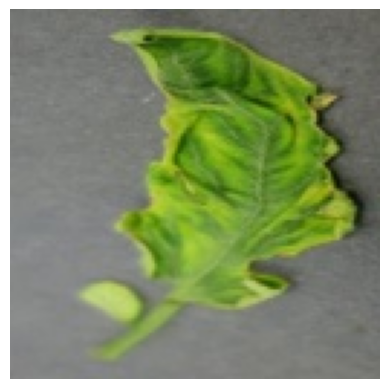

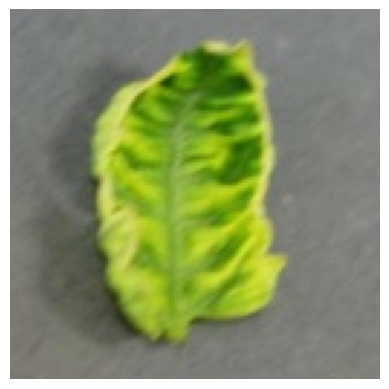

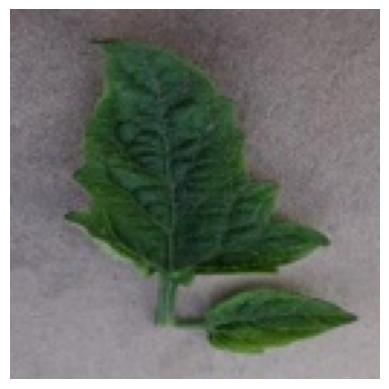

Class: powdery_mildew


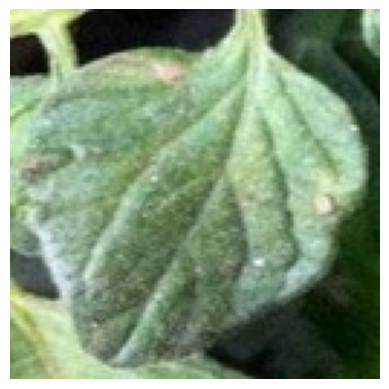

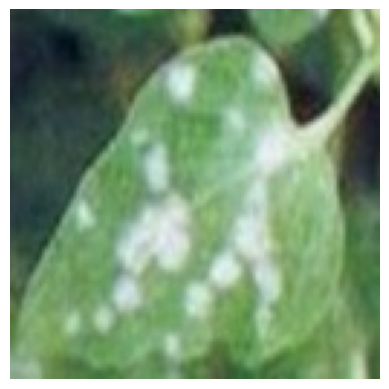

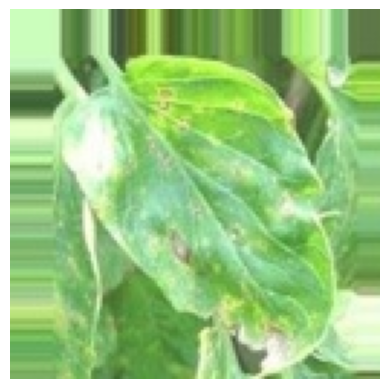

Class: healthy


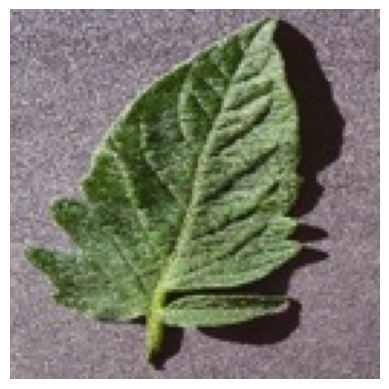

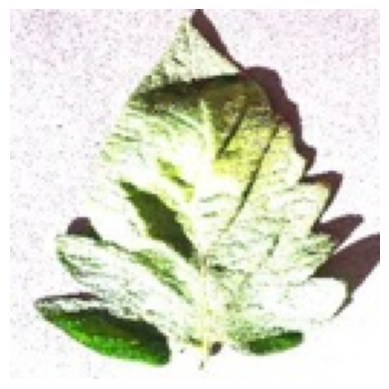

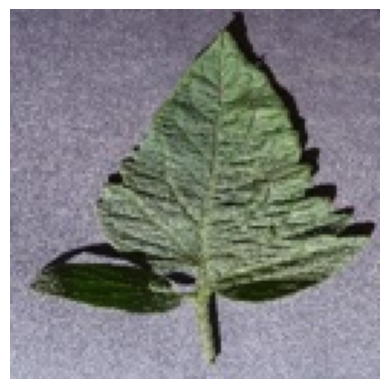

Class: Early_blight


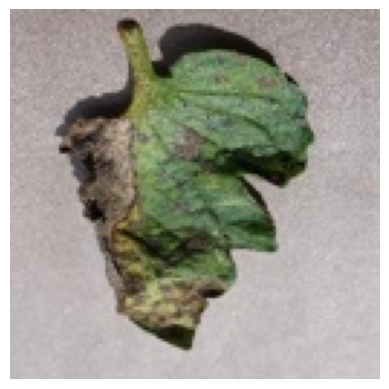

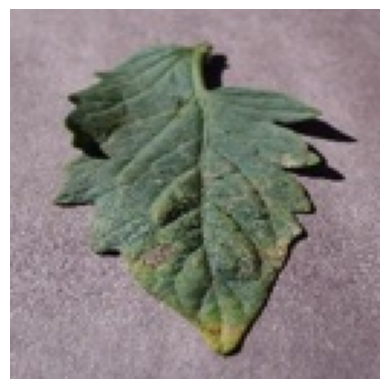

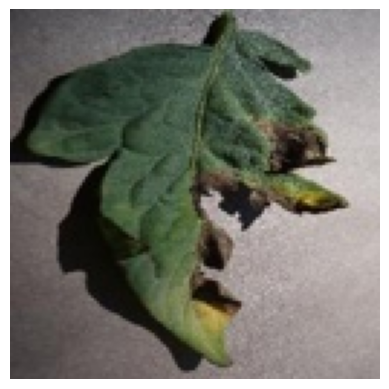

Class: Target_Spot


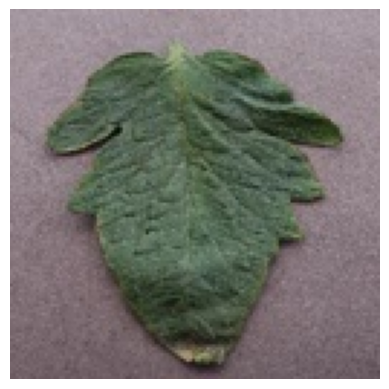

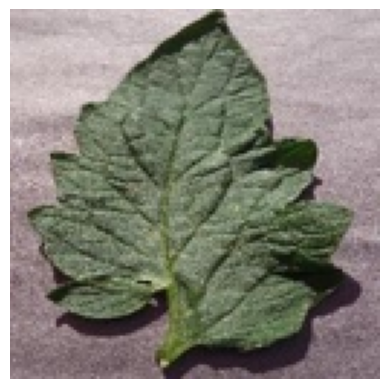

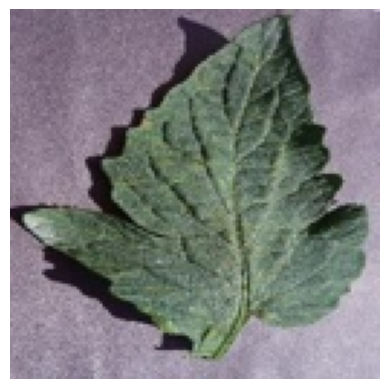

Class: Leaf_Mold


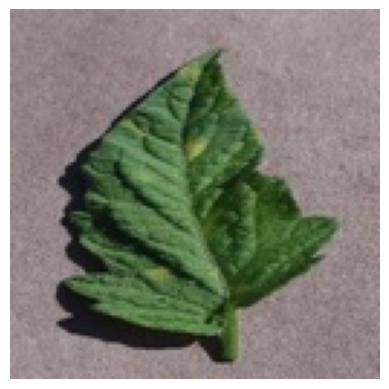

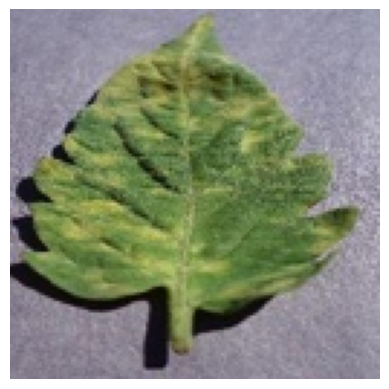

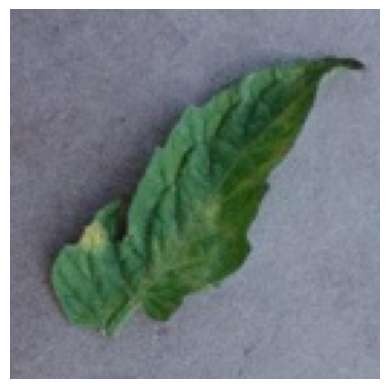

Class: Tomato_mosaic_virus


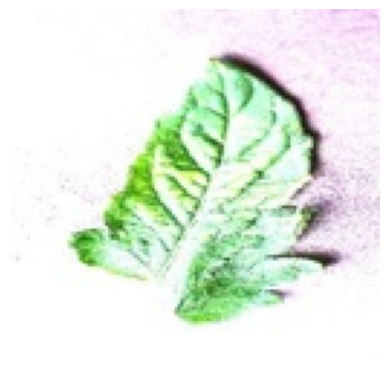

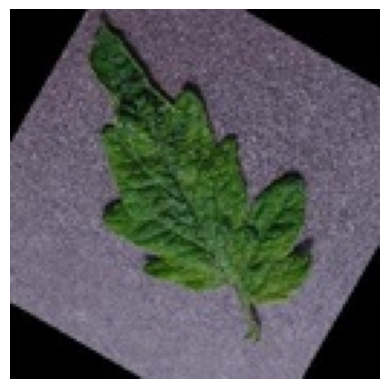

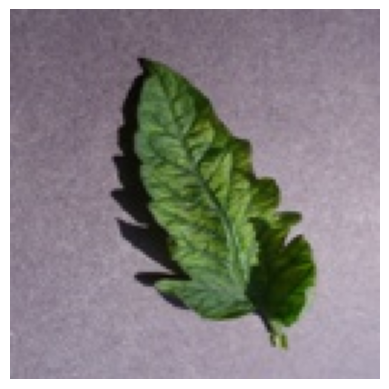

Class: Bacterial_spot


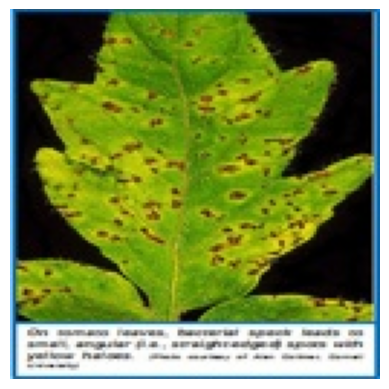

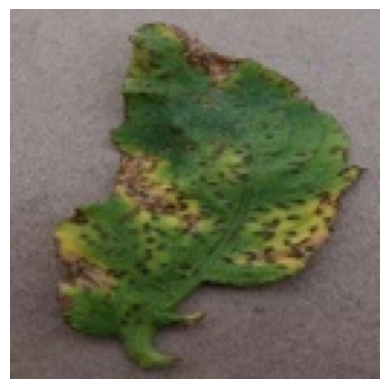

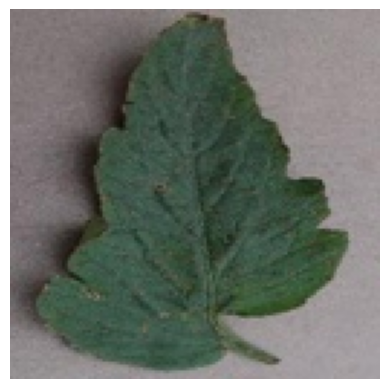

Class: Spider_mites Two-spotted_spider_mite


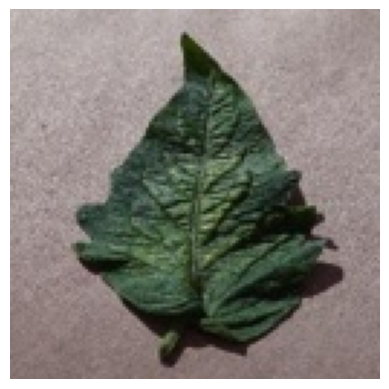

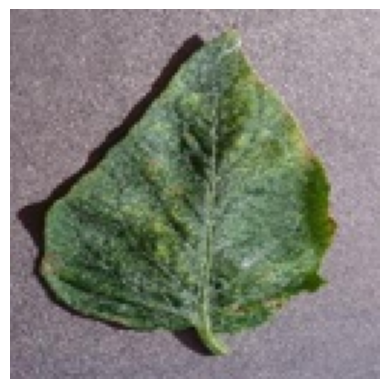

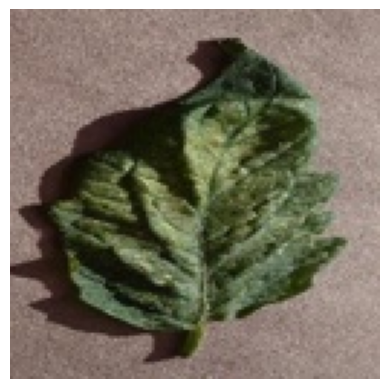

In [38]:
folder_path = "all_images_preprocessed"
num_images_per_class = 3
print_images(folder_path, num_images_per_class)